# LMECA2300: Advanced Numerical Methods
## Assignment 2

**Students:**
- Student 1: Victor Lepère (61502000)
- Student 2: Max Opdecam(77062000)

### Question 1: Straight line study

We begin this report by first describing the mathematical equations that allow us to derive the pressure at some observer point in the 2D plane, that we denote $\mathbf{r}$, from a constant velocity source spread over a straight line. More precisely, the straight line is made of two points, $\mathbf{r_1}'$ and $\mathbf{r_2}'$, and is denoted by $\Gamma'$. \
As seen during the lectures, the phasor of the pressure wave at $\mathbf{r}$ is given by
$$
p(\mathbf{r}) = \frac{\omega \rho_0}{4} \int_{\Gamma'} H_0^{(2)} (k \rho) v_n d\Gamma'
$$
Where
- $\omega$ is the angular frequency;
- $k$ is the wavenumber;
- $\rho$ is the distance between $\mathbf{r}$ and $\mathbf{r}'$;
- $v_n$ is the normal velocity, assumed constant in this context.
Considering any point $\mathbf{r}'$ that compose the segment, the integral can also be written as
$$
\begin{align*}
p(\mathbf{r}) &= \frac{\omega \rho_0}{4} \int_{\mathbf{r_1}'}^{\mathbf{r_2}'} H_0^{(2)} (k \rho(\mathbf{r}')) v_n d\mathbf{r}' \\
              &\downarrow \textit{change of variable :  } \ \mathbf{r}' = \mathbf{r_1}' + s (\mathbf{r_2}' - \mathbf{r_1}') \quad s \in [0, 1] \\
              &= \frac{\omega \rho_0}{4} \int_0^1 H_0^{(2)} (k \rho(s)) v_n L ds \\
              &= \frac{\omega \rho_0}{4} \sum_{i=1}^m \int_{\frac{i-1}{m}}^{\frac{i}{m}} H_0^{(2)} (k \rho(s)) v_n L ds \\
              &\approx \frac{\omega \rho_0}{4} \sum_{i=1}^m \frac{v_n L}{2} \left [ H_0^{(2)} \left (k \rho \left (\frac{i-1}{m} \right) \right) + H_0^{(2)} \left(k \rho \left(\frac{i}{m} \right) \right) \right ]
\end{align*}
$$
Where $L = ||\mathbf{r}_1 - \mathbf{r}_2||_2$ and we used the composite Trapezium rule to discretize the integral.

In the implementation, each segment is represented by an instance of `Edge` class whose code is given below. Also note that the `integral` methods performed the computations described above and return the amplitude of the pressure at position `obs` with respect to the velocity `Vn`. Actually, `obs` is not expected to be a single position but an array of positions such that we can leverage Python vectorization and reduce the computational burden of the simulation.

> Note that the Hankel function presents a singularity at the origin hence a warning is raised when the observer point is choosen too close to the origin.

In [3]:
### Imports
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation
from scipy.special import hankel2
from math import ceil

### Physical constants
rho0 = 1.2 # air, 20°C, 1 atm
f = 100 # [hz]
w = 2*np.pi*f # air -> 343 = w/k
k = w/343
longueur_onde = (2*np.pi)/k
m = 100

### A segment
class Edge:
    def __init__(self,r1,r2):
        self.r1 = r1
        self.r2 = r2

    def norm(self):
        r = self.r1-self.r2
        return(np.sqrt(r[0]**2 + r[1]**2))

    def integral(self, Vn, obs):
        """
        Parameters
        ----------
        Vn : float
            constant normal velocity w.r.t interface
        obs : 2d array
            grid of observation points.

        Returns
        -------
        l'intégrale.

        """
        obs = np.atleast_2d(obs) # (N,2)

        s = np.linspace(0, 1, m) # (m,)
        diff = obs[:, np.newaxis, :] - (self.r1 + s[:, np.newaxis] * (self.r2-self.r1)) # (N,m,2)
        rho = np.linalg.norm(diff, axis=-1) # (N,m)

        H = hankel2(0, k * rho) # (N,m)
        if np.any(np.isnan(H)):
            raise ValueError("Hankel function evaluated at singular point, change geometry or grid.")
        
        H[:, 0] *= 1/2
        H[:, -1] *= 1/2

        integral = w * rho0 * Vn * self.norm() * np.sum(H, axis=1) / m # (N,)
        return integral

### Question 2: Discretization of a geometry and application

Now that we are able to infer the pressure from a velocity along a straight line, we can use it to discretize more complex geometries as a collection of segments. In particular, we chose to discretize a circle such that the length of each segment is equal to $\frac{\lambda}{10}$. \
You can find below the function `circle_maker` that generates such a circle, given its `radius` and `center`.

In [5]:
def circle_maker(radius,center):
    """
    Parameters
    ----------
    rayon : int
        rayon en cellule.
    center : (int,int)
        index matrice du centre.
    Returns
    -------
    liste des edges du pourtour de la section.
    """
    
    circonf = 2*np.pi*radius
    long_edge = longueur_onde/10
    n_edges = ceil(circonf/long_edge)
    
    angle = 360/n_edges/180*np.pi
    r1 = np.array(center)+np.array((radius,0))
    all_edges = []
    current_angle = angle
    
    #création des edges
    for i in range(n_edges + 1):
        r2 = center + np.array((radius*np.cos(current_angle), radius*np.sin(current_angle)))
        edge = Edge(r1, r2)
        all_edges.append(edge)
        r1 = r2
        current_angle = current_angle + angle
            
    return all_edges

edges = circle_maker(1, (0,0))

In our case, the circle aims at representing a directional speaker. Those speakers are made in such a way that they possess a preferable emitting direction. Those are usually used in concert appening in cities so that the spectators can enjoy the music but the noise pollution of the concert is reduce.

We interste ourself to a plane parrallel to the speaker and so the distribution of the velocities was set accordingly, as follows in code:

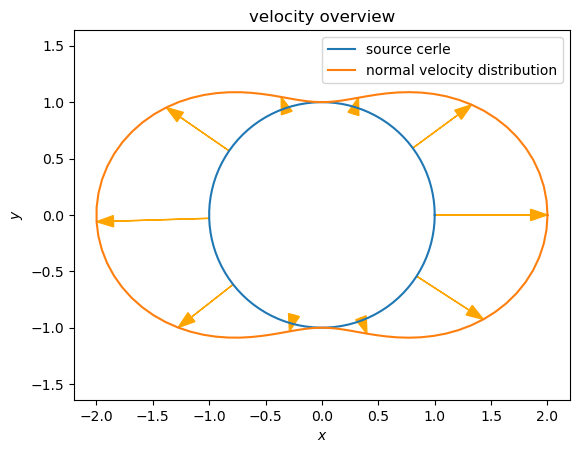

In [7]:
angle = np.linspace(0,6.28,100)
c1 = np.cos(angle)
c2 = np.sin(angle)
velocity_distribution=np.ones(100)
velocity_distribution = velocity_distribution*(np.cos(angle)**2)
    
r1 = velocity_distribution*np.cos(angle)+c1
r2 = velocity_distribution*np.sin(angle)+c2

plt.plot(c1,c2,label = 'source cerle')
plt.plot(r1,r2,label = 'normal velocity distribution')
d1 = r1 -c1
d2 = r2 -c2
for i in range(10):
    plt.arrow(c1[i*10], c2[i*10], d1[i*10], d2[i*10], color = 'orange',head_width = 0.1,length_includes_head=True)
plt.xlabel("$x$")
plt.ylabel("$y$")
plt.axis('equal')
plt.legend()
plt.title("velocity overview")
plt.show()

In [8]:
velocity_distribution =np.ones(len(edges))
for i in range(len(edges)):
    mid_point_x = (edges[i].r1[0]+edges[i].r2[0])/2
    mid_point_y = (edges[i].r1[1]+edges[i].r2[1])/2
    
    angle = np.arctan2(mid_point_x,mid_point_y)
    velocity_distribution[i] = velocity_distribution[i]*(np.cos(angle)**2)

To achieve a global overview of the pressure field induced by the circle-shaped source, we discretize the 2D space around it thanks to uniform grid. Therefore, the phasor values of the pressure are computed at the nodes that compose the grid and then interpolated for the visualization. An overview of the grid and the circle is displayed below.

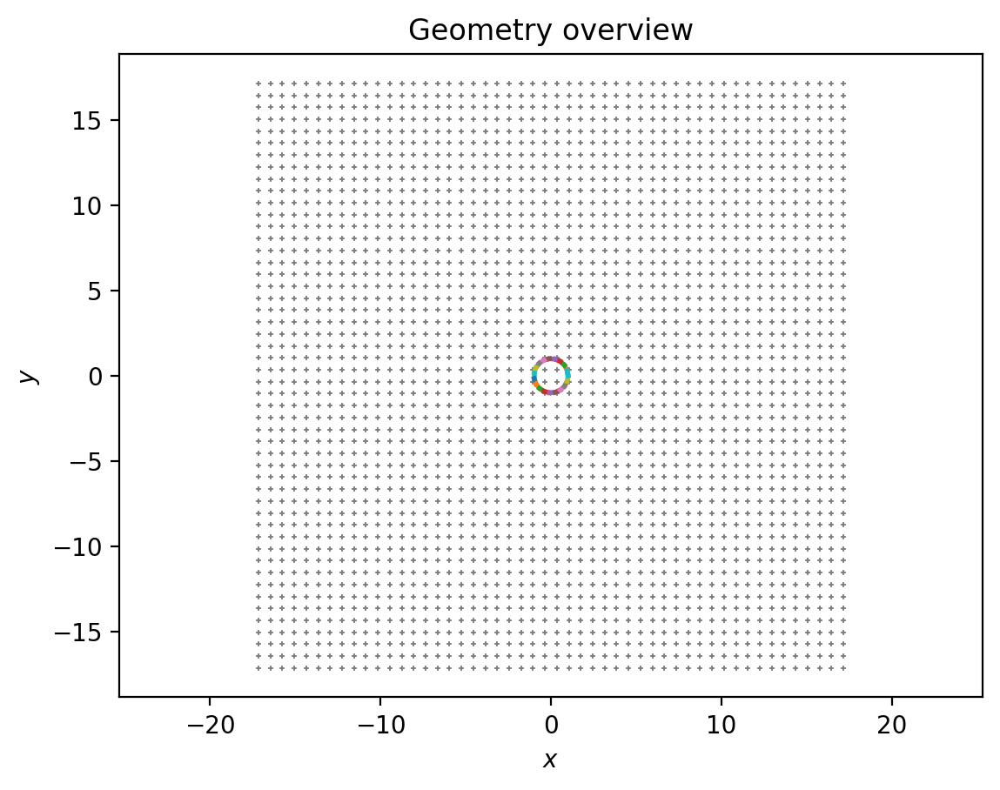

In [10]:
### Create grid
gridsize = 50
x = np.linspace(-5*longueur_onde, 5*longueur_onde, gridsize)
X, Y = np.meshgrid(x, x)
coord_array = np.column_stack((X.ravel(), Y.ravel()))

### Plot
plt.figure(dpi=200)
for i in range(len(edges)):
    plt.plot([edges[i].r1[0], edges[i].r2[0]], [edges[i].r1[1], edges[i].r2[1]], "-", linewidth=2)
    plt.scatter(coord_array[:, 0], coord_array[:, 1], c='gray', marker="+", s=.75)

plt.xlabel("$x$")
plt.ylabel("$y$")
plt.axis('equal')
plt.title("Geometry overview")
plt.show()

Finally, we can compute the integral presented in the first section for each segment that make up the circle and sum up all contributions for each node of the grid. The so-obtained nodal values are time-independent but we can make the solution visible in time domain by doing an inverse phasor transformation for different time instants, without recomputing it which makes the simulation lightweight.

In [12]:
grid_integrals = np.zeros((gridsize * gridsize, len(edges)), dtype=complex)

for i in range(len(edges)):
    grid_integrals[:,i] = edges[i].integral(velocity_distribution[i], coord_array)
grid_integrals = np.sum(grid_integrals, axis=-1) # sum up all contributions

plt.rcParams["animation.html"] = "jshtml"
plt.ioff()

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

def animate(t):
    plt.cla()
    pressures = np.real(grid_integrals * np.exp(1j* t/2))
    ax.plot_surface(X, Y, pressures.reshape(X.shape))

    plt.xlim(-5*longueur_onde, 5*longueur_onde)
    plt.ylim(-5*longueur_onde, 5*longueur_onde)
    ax.set_zlim(-1000, 1000)
    ax.set_title("Pressure field")
    fig.tight_layout()
    

matplotlib.animation.FuncAnimation(fig, animate, frames=50, interval=60)